In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.utils.data
import torchvision
import timm
import kornia
from torch.utils.data import DataLoader
from tqdm import tqdm


class NormalizedModel(torch.nn.Module):

    def __init__(self, model, mean, std):
        super(NormalizedModel, self).__init__()
        self.model = model
        self.mean = torch.nn.Parameter(torch.Tensor(mean).view(-1, 1, 1), requires_grad=False)
        self.std = torch.nn.Parameter(torch.Tensor(std).view(-1, 1, 1), requires_grad=False)

    def forward(self, x):
        out = (x - self.mean) / self.std 
        out = self.model(out)
        return out
    
    
dataset = torchvision.datasets.ImageNet("/workspace/data/datasets/imagenet/", 
                                        split="val", 
                                        transform=torchvision.transforms.Compose(
                                            [
                                                torchvision.transforms.Resize(256), 
                                                torchvision.transforms.CenterCrop(224), 
                                                torchvision.transforms.ToTensor()
                                            ]
                                        )
                                       )

dataloader = DataLoader(dataset, batch_size=128, shuffle=True, pin_memory=True, num_workers=1)

for x, y in (dataloader):
    bx = x.cuda()
    by = y.cuda()
    break
    
    
model = timm.create_model("resnet50", pretrained=True)
model = NormalizedModel(model, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
model.cuda()
model.eval()
pass

In [27]:
a = torch.rand(len(by), requires_grad=True, device="cuda") 

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam([a], lr=10)


def diff_solarize(x, th, T=1e1):
    z = (1 - x)
    y = x
    eps = th.view(-1, 1, 1, 1)

    xx = torch.sigmoid((x - eps) * T) * (z - y) + y

    return xx

with torch.no_grad():
    logits = model(bx)
    loss = criterion(logits, by)
    acc = (logits.argmax(dim=1) == by).float().mean().item()
    print(acc)


for e in range(20):
    bx_aug = diff_solarize(bx, a)
    logits = model(bx_aug)

    loss = criterion(logits, by)

    (-loss).backward()

    acc = (logits.argmax(dim=1) == by).float().mean().item()
    optimizer.step()
    
#     with torch.no_grad():
#         a = torch.clip(a, 0, 1)

    print(e, "Loss:", loss.item(), "Acc:", acc, "Mean:", a.detach().mean().item())
    
#     plt.imshow(torch.clip(bx_aug[0], 0, 1).permute(1, 2, 0).detach().cpu().numpy())
#     plt.show()

0.8828125
0 Loss: 0.8278331756591797 Acc: 0.828125 Mean: -0.18587708473205566
1 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -0.8559055328369141
2 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -1.5145641565322876
3 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -2.1680502891540527
4 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -2.818568468093872
5 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -3.467165231704712
6 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -4.114428520202637
7 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -4.760722637176514
8 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -5.406292915344238
9 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -6.051293849945068
10 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -6.6958537101745605
11 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -7.340063571929932
12 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -7.983996391296387
13 Loss: 0.5718861222267151 Acc: 0.8515625 Mean: -8.627716064453125
14 Loss: 0.5718861222267151 Acc: 0.8515625 

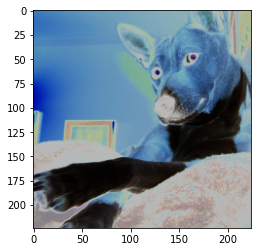

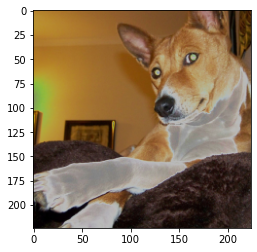

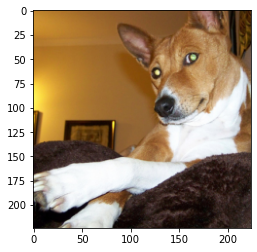

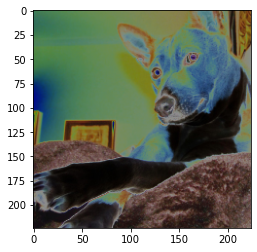

In [ ]:
plt.imshow(diff_solarize(bx, torch.zeros(len(by), requires_grad=True, device="cuda"))[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()
plt.imshow(diff_solarize(bx, torch.ones(len(by), requires_grad=True, device="cuda"))[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()
plt.imshow(bx[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()
plt.imshow(bx_aug[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()

# lp-attack

In [ ]:
import torchvision.transforms.functional as F

plt.rcParams["savefig.bbox"] = 'tight'


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(20,4))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

0.8828125


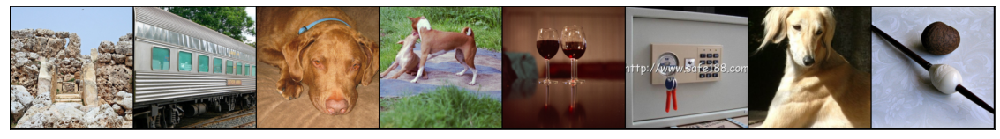

0 Loss: 3.3630542755126953 Acc: 0.3359375 Mean: 7.010652916505933e-05


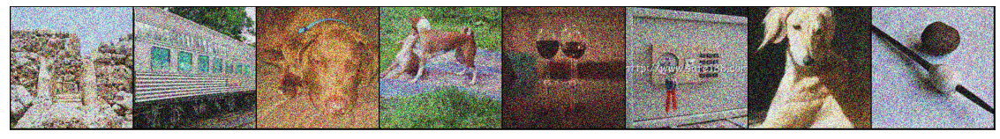

1 Loss: 3.5093469619750977 Acc: 0.328125 Mean: 7.009694672888145e-05


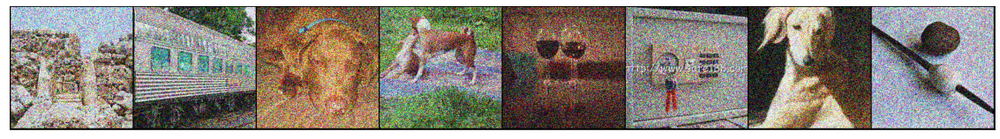

2 Loss: 3.655345916748047 Acc: 0.296875 Mean: 7.008758984738961e-05


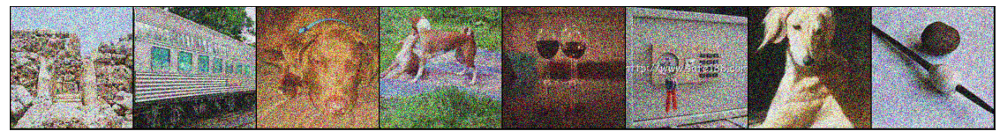

3 Loss: 3.7997331619262695 Acc: 0.28125 Mean: 7.007903332123533e-05


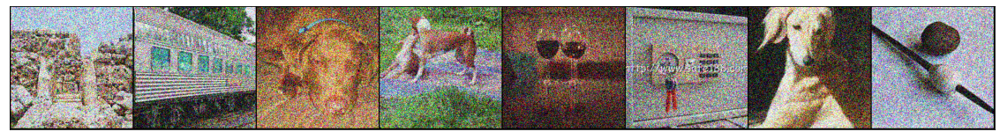

4 Loss: 3.9417459964752197 Acc: 0.265625 Mean: 7.007105887169018e-05


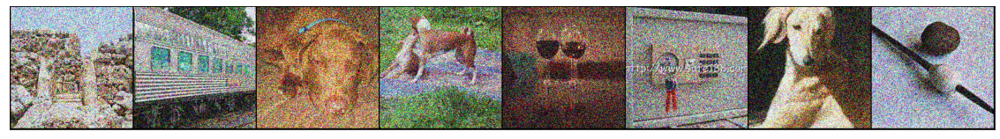

5 Loss: 4.08270263671875 Acc: 0.25 Mean: 7.006395026110113e-05


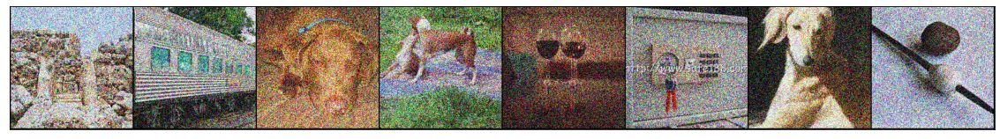

6 Loss: 4.223227500915527 Acc: 0.25 Mean: 7.005713996477425e-05


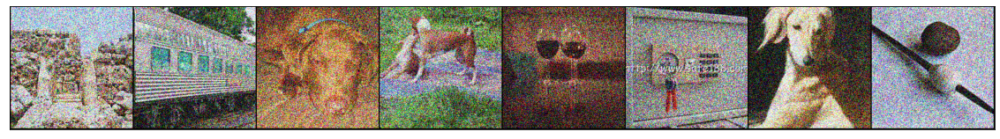

7 Loss: 4.362774848937988 Acc: 0.234375 Mean: 7.004993676673621e-05


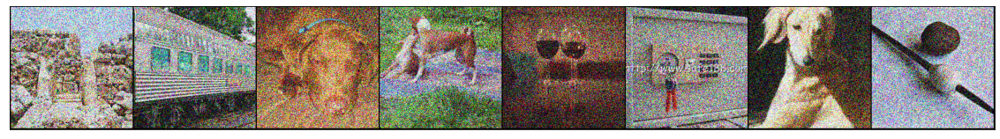

8 Loss: 4.500101566314697 Acc: 0.21875 Mean: 7.004191866144538e-05


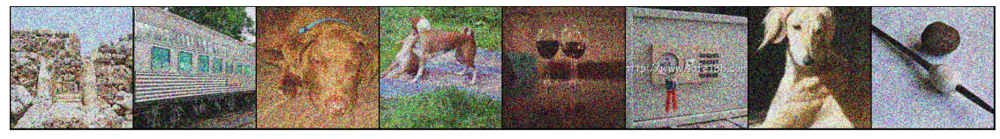

9 Loss: 4.633110523223877 Acc: 0.21875 Mean: 7.00345408404246e-05


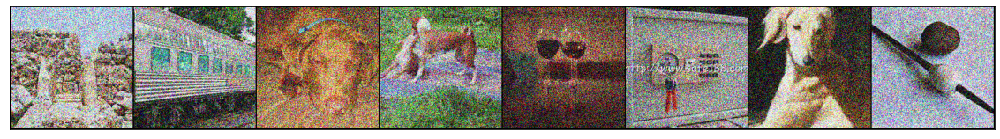

10 Loss: 4.764366626739502 Acc: 0.21875 Mean: 7.002754864515737e-05


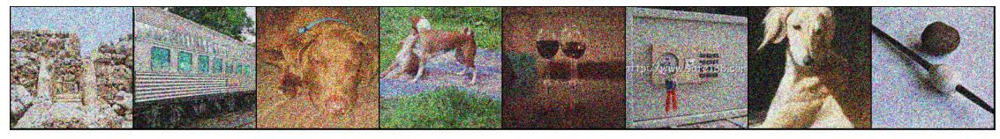

11 Loss: 4.892710208892822 Acc: 0.21875 Mean: 7.002175698289648e-05


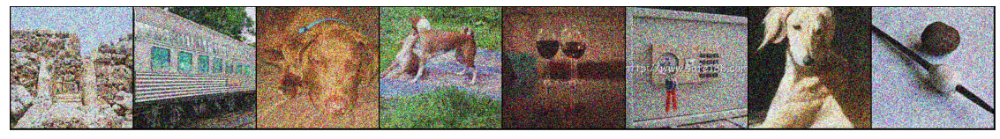

12 Loss: 5.020529747009277 Acc: 0.21875 Mean: 7.00150485499762e-05


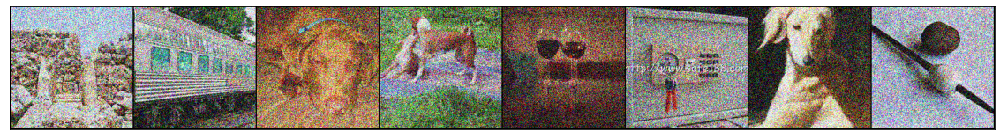

13 Loss: 5.14880895614624 Acc: 0.21875 Mean: 7.000890764174983e-05


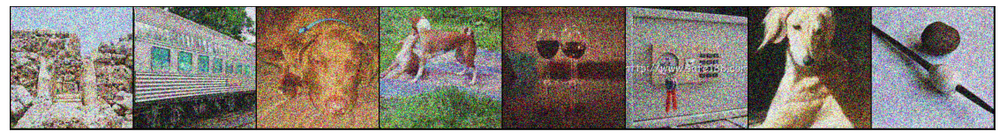

14 Loss: 5.275510311126709 Acc: 0.21875 Mean: 7.000352343311533e-05


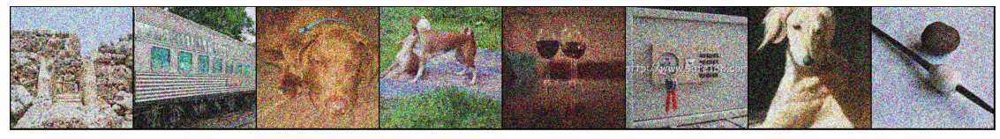

15 Loss: 5.404199123382568 Acc: 0.2109375 Mean: 6.999837205512449e-05


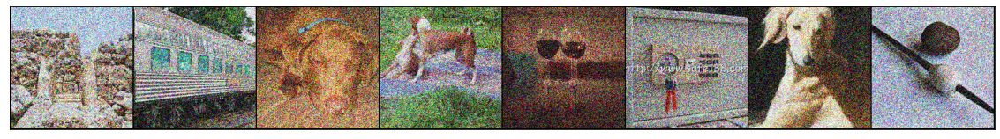

16 Loss: 5.532835960388184 Acc: 0.2109375 Mean: 6.999359175097197e-05


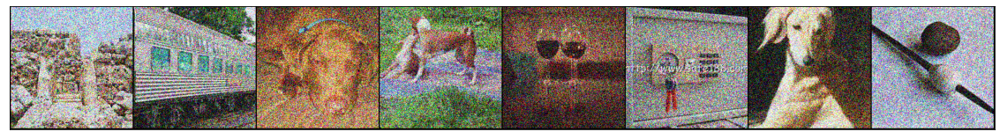

17 Loss: 5.661051273345947 Acc: 0.2109375 Mean: 6.998791650403291e-05


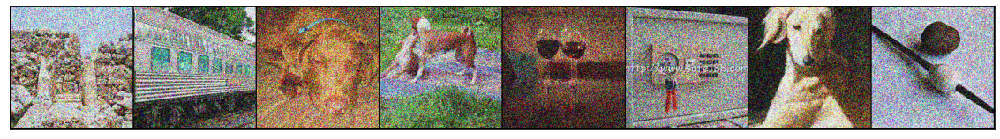

18 Loss: 5.7872843742370605 Acc: 0.203125 Mean: 6.998275785008445e-05


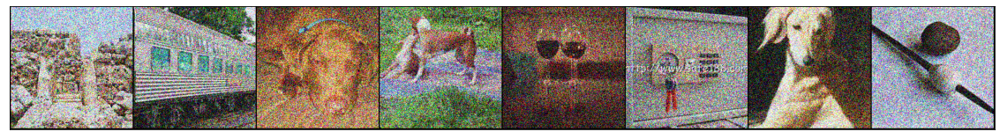

19 Loss: 5.913305759429932 Acc: 0.203125 Mean: 6.997748278081417e-05


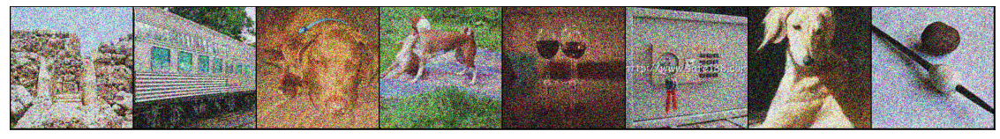

In [ ]:
a = torch.rand((len(by), 3, 224, 224), requires_grad=True, device="cuda") 
a.data = a.data - 0.5

criterion = torch.nn.CrossEntropyLoss()

eta = .1

with torch.no_grad():
    logits = model(bx)
    loss = criterion(logits, by)
    acc = (logits.argmax(dim=1) == by).float().mean().item()
    print(acc)

    show(torchvision.utils.make_grid(bx[:8], value_range=(0, 1)))
    plt.show()

for e in range(20):
    bx_aug = torch.clip((bx + a), 0, 1)

    adv_logits = model(bx_aug)
    adv_loss = criterion(adv_logits, by)
    adv_loss.backward()
    
    a.data = a.data + eta * a.grad.data  # gradient ascent!
    a.grad.data.zero_()
        
    with torch.no_grad():
        bx_aug = torch.clip(bx + a, 0, 1)
        logits = model(bx_aug)
        loss = criterion(logits, by)
        acc = (logits.argmax(dim=1) == by).float().mean().item()

        print(e, "Loss:", loss.item(), "Acc:", acc, "Mean:", a.detach().mean().item())
    
        show(torchvision.utils.make_grid(bx_aug[:8], value_range=(0, 1)))
        plt.show()

In [ ]:
eps = (4/255)

txcorrect = 0
txtotal = 0

for x, y in (dataloader):
    bx = x.cuda()
    by = y.cuda()
    
    a = torch.zeros((len(by), 3, 224, 224), requires_grad=True, device="cuda")

    criterion = torch.nn.CrossEntropyLoss()

    x_adv = torch.clip(bx + a, 0, 1)
    adv_logits = model(x_adv)
    adv_loss = criterion(adv_logits, by)
    adv_loss.backward()

    a.data = a.data + eps * a.grad.data.sign()  # gradient ascent!
    a.grad.data.zero_()

    with torch.no_grad():
        x_adv = torch.clip(bx + a, 0, 1)
        logits = model(x_adv)
        loss = criterion(logits, by)

        correct = (logits.argmax(dim=1) == by).float().sum().item()
        
        txcorrect += correct
        txtotal += len(by)

        print("Loss:", loss.item(), "Acc:", correct / len(by), "Mean:", a.detach().mean().item())
        
print(txcorrect / txtotal)

Loss: 6.394167423248291 Acc: 0.234375 Mean: 3.1246222533809487e-06
Loss: 7.110374450683594 Acc: 0.234375 Mean: -2.548224529164145e-07
Loss: 6.798015594482422 Acc: 0.21875 Mean: 2.9267901027196785e-06
Loss: 6.633942604064941 Acc: 0.234375 Mean: -7.196886144811288e-07
Loss: 7.284393310546875 Acc: 0.2421875 Mean: 7.898667718109209e-06
Loss: 6.619168758392334 Acc: 0.2109375 Mean: 2.808739054671605e-06
Loss: 7.129275321960449 Acc: 0.21875 Mean: -2.1085922981001204e-06
Loss: 7.176431179046631 Acc: 0.2734375 Mean: 2.491231498424895e-06
Loss: 7.891631603240967 Acc: 0.2421875 Mean: -3.907872070385565e-08
Loss: 7.396702289581299 Acc: 0.2734375 Mean: 2.6304473976779263e-06
Loss: 6.802457332611084 Acc: 0.203125 Mean: -2.703718109842157e-06
Loss: 6.489257335662842 Acc: 0.265625 Mean: 4.0169074964069296e-06
Loss: 6.215183734893799 Acc: 0.2421875 Mean: 2.6573134164209478e-06
Loss: 7.088730335235596 Acc: 0.171875 Mean: 2.124873390130233e-06
Loss: 6.9394426345825195 Acc: 0.234375 Mean: 5.28531745658256